#### Student Name:
#### Student ID:

# Assignment 8

#### Parallel CNN - RNN Model

Instructions: 

* This notebook is an interactive assignment; please read and follow the instructions in each cell. 

* Cells that require your input (in the form of code or written response) will have 'Question #' above.

* After completing the assignment, please submit this notebook and a printout as a PDF.

# Let's try using a neural networks to classify audio genres


## Your Task:

In this Assignment we will explore the use of CNN-RNN for genre classification. You are provided some code as usual, and are asked to fill in missing portions and perform some experiments. 

The main tasks are:
* specifying the parameters of the CNN model
* you are provided with the code of the RNN model
* conducting an experiment with CNN-RNN model
* visualizing the preformance of the CNN layers
* performing ablation study by comparing it to only CNN and only RNN model


### Import packages

In [1]:
!{__import__('sys').executable} -m pip install --upgrade --quiet librosa matplotlib numpy keras keract tensorflow

import numpy as np
import os
from os.path import isfile
import keras
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Bidirectional, LSTM, Dropout, Activation, GRU
from keras.layers import Conv2D, concatenate, MaxPooling2D, Flatten, Embedding, Lambda


from keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from keras import backend as K
from keras.utils import np_utils
from tensorflow.keras.optimizers import RMSprop

from keras import regularizers


import librosa
import librosa.display
import matplotlib.pyplot as plt
import matplotlib as mpl

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

mpl.rcParams['image.aspect'] = 'auto'
mpl.rcParams['figure.constrained_layout.use'] = True

import keract

/bin/bash: /opt/conda/lib/libtinfo.so.6: no version information available (required by /bin/bash)


In [2]:
import collections

def iterable(o):
    return isinstance(o, collections.abc.Iterable)

### Define representation of genres

Each genre is assigned a number, since the neural network will output a number [not a word]. 

In [3]:
dict_genres = {'Electronic': 0, 'Experimental': 1, 'Folk': 2, 'Hip-Hop': 3, 
               'Instrumental': 4,'International': 5, 'Pop': 6, 'Rock': 7}


reverse_map = {v: k for k, v in dict_genres.items()}
print(reverse_map)

{0: 'Electronic', 1: 'Experimental', 2: 'Folk', 3: 'Hip-Hop', 4: 'Instrumental', 5: 'International', 6: 'Pop', 7: 'Rock'}


### Load the dataset 

The dataset can be found at https://drive.google.com/drive/folders/1ZtwC9ralBSs6wzP-IylX5uh1wD1YXLh9?usp=sharing

Instructions: you can manually download it to your computer, or use wget from a command line. \
If you are using colab, you can copy the files to your drive and then mount the drive using google colab drive command: \
from google.colab import drive \
drive.mount('/content/drive')

In [4]:
npzfile = np.load('data/shuffled_train.npz')

X_train = npzfile['arr_0']   # Audio samples
y_train = npzfile['arr_1']   # Genre labels
print(X_train.shape, y_train.shape)

(6394, 640, 128) (6394, 8)


In [5]:
npzfile = np.load('data/shuffled_valid.npz')

X_valid = npzfile['arr_0']
y_valid = npzfile['arr_1']
print(X_valid.shape, y_valid.shape)

(800, 640, 128) (800, 8)


### Let's see what one data sample looks like:

Electronic


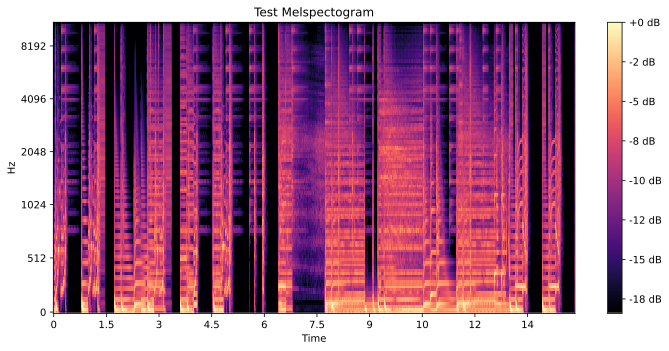

In [6]:
one_arbitrary_sample = 0
spectogram = X_train[one_arbitrary_sample]
genre = np.argmax(y_train[one_arbitrary_sample])
print(reverse_map[genre])     # Reverse Map: Number to Label

plt.figure(figsize=(10, 5))
librosa.display.specshow(spectogram.T, y_axis='mel', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Test Melspectogram')
plt.tight_layout()

##### Question 1 (20 points)

Create a few mel-spectograms samples for each genre. What are some visual differences between the genres? Are there similarities? What are some unique features for each genre that we might be able to use for classification?

In [7]:
import pandas as pd
import numpy as np


def _one_hot_decode(df):
    return df.idxmax('columns').astype('category')

def _reverse_series(s : pd.Series):
    return pd.Series(s.index.values, index = s)

def _sample_genre(data, size = 1):
    global dict_genres
    
    return (
        _reverse_series(
            _one_hot_decode(
                pd.DataFrame(
                    data, 
                    columns = dict_genres
                )
            )
        )
        .groupby(level = 0)
        .apply(lambda s: np.random.choice(s, size = size))
    )

y_train_ = _sample_genre(y_train, size = 2)

y_train_

Electronic       [2420, 2995]
Experimental      [207, 5950]
Folk             [5419, 1528]
Hip-Hop          [4785, 1449]
Instrumental     [5674, 2519]
International    [2462, 1592]
Pop              [6307, 2485]
Rock             [1784, 2521]
dtype: object

/tmp/ipykernel_1844/4249657886.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  return isinstance(o, collections.Iterable)


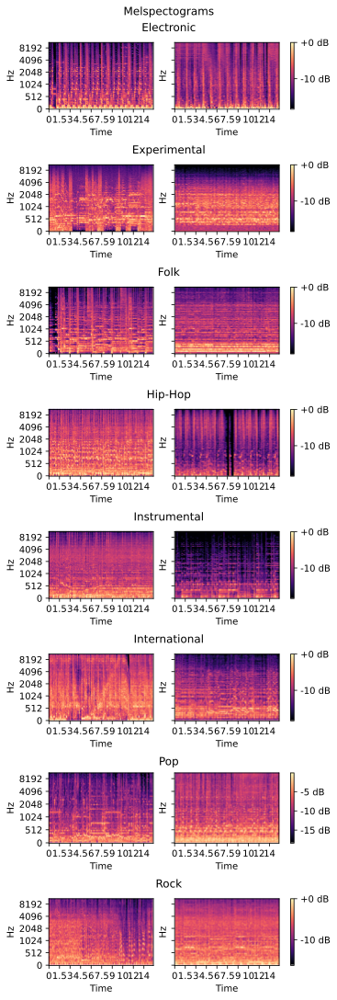

In [8]:
fig = plt.figure(
    figsize = (5, 15),
    constrained_layout = True
)
fig.suptitle('Melspectograms')
subfigs = fig.subfigures(
    nrows = len(y_train_), ncols = 1
)

axes, img = None, None
for subfig, (genre, samples) in zip(subfigs.flatten(), y_train_.items()):
    axes = subfig.subplots(
        nrows = 1, ncols = len(samples),
        sharex = True, sharey = True
    )
    subfig.suptitle(genre)
    
    for ax, sample in zip(axes.flatten() if iterable(axes) else [axes], samples):
        spectogram = X_train[sample]
        img = librosa.display.specshow(
            spectogram.T, 
            ax = ax, 
            y_axis = 'mel', x_axis = 'time'
        )
    subfig.colorbar(img, ax = axes, format = '%+2.0f dB')
    
fig.show()

``` Your response here ```

The amplitude and frequency range varies significantly across genres and samples, although for some samples the spectrograms do look similar regardless of genre. The spectrograms of electronic are fairly consistent and quite distinct from other genres. Hop-hop has gaps.

### Convolution Layer

A convolution is a kernel (a matrix of weights; also reffered to as a mask) that is applied across an image to extract spatial information by factoring each point's neighbors.  

Classical image processing uses custom kernels that can extract key features that can be used for problems like edge detection. Refer to this Wiki article for a few examples.
https://en.wikipedia.org/wiki/Kernel_(image_processing)

In deep learning, we build a model to learn more complicated kernels that can extract more specialized information.

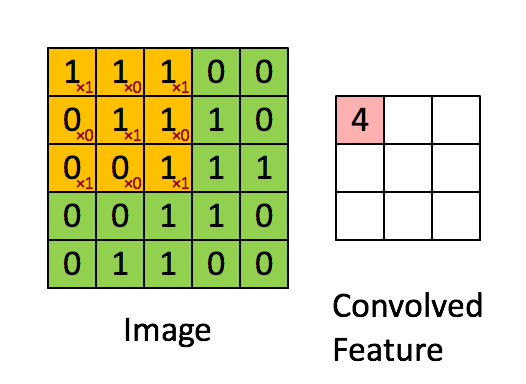

##### Question 2 (10 points)

Given a convolution layer with $f$ filters, ($k_x$ x $k_y$) kernel, and ($s_x$ x $s_y$) stride, what is the output dimension with/without padding (ie "valid" vs "same") on an ($n_x$ x $n_y$) image?

Please refer to the official keras documentation (https://keras.io/api/layers/convolution_layers/convolution2d/)

``` Your response here ```

- "same" padding: $n_x \times n_y$
- "valid" padding: means no padding. $\left[n_x - f\right] \times \left[n_y - f\right]$

### Pooling Layer

A pool is a very similar to a convolution layer. It is filter that is applied across the output of the convolution layer to reduce dimensionality and mitigate overfitting by summarizing the convolution results.

For this demonstration, we will be using max pooling.

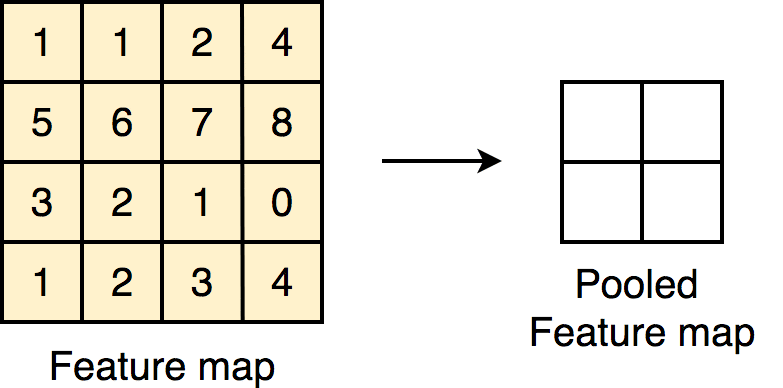

##### Question 3 (10 points)

Given a pooling layer ($p_x$ x $p_y$) pool and ($s_x$ x $s_y$) stride, what is the output dimension with/without padding (ie "valid" vs "same") on an ($n_x$ x $n_y$) image?

Please refer to the official keras documentation (https://keras.io/api/layers/pooling_layers/max_pooling2d/)

``` Your response here ```

- "same" padding: 
    - `output_shape = math.floor((input_shape - 1) / strides) + 1`
    - $\left[\left\lfloor\frac{n_x - 1}{s_x}\right\rfloor + 1\right] \times \left[\left\lfloor\frac{n_y - 1}{s_y}\right\rfloor + 1\right]$
- "valid" padding: 
    - `output_shape = math.floor((input_shape - pool_size) / strides) + 1`
    - $\left[\left\lfloor\frac{n_x - p_x}{s_x}\right\rfloor + 1\right] \times \left[\left\lfloor\frac{n_y - p_y}{s_y}\right\rfloor + 1\right]$

### Now we will implement our model 
#### Parallel CNN - RNN Model

Since music has temporal features, it is obvious to use a RNN, but we saw from the melspectograms that there are also visual features that a CNN might learn. Our motivation is to try to combine both models through concatenation to extract both temporal and spatial features. 

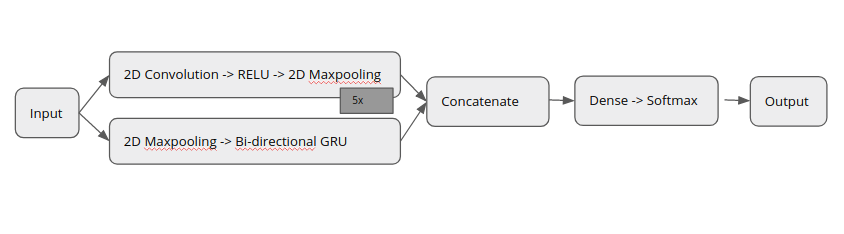

In [9]:
# The number of possible predicted classes
num_classes = 8

# The number of features in a single data input (frequency components)
n_features = X_train.shape[2]

# The length of an input sample (in seconds)
n_time = X_train.shape[1]

In [10]:
def conv_recurrent_model_build(model_input):
    print('Building model...')
    layer = model_input
    
    ### Convolutional blocks    
    '''
    conv_1 = Conv2D(filters=16, kernel_size=(3,1), strides=1,
                    padding='valid', activation='relu', name='conv_1')(layer)
    pool_1 = MaxPooling2D((2,2))(conv_1)
    '''
    
    # Your Code Here
    n_layers = 5
    for i, (kwargs_Conv2D, kwargs_MaxPooling2D) in zip(
        range(n_layers), 
        [
            ({'filters': 16}, {'pool_size': (2, 2)}),
            ({'filters': 32}, {'pool_size': (2, 2)}),
            ({'filters': 64}, {'pool_size': (2, 2)}),
            ({'filters': 64}, {'pool_size': (4, 4)}),
            ({'filters': 64}, {'pool_size': (4, 4)})
        ]
    ):    
        layer = Conv2D(
            name = f'conv_{i}',
            kernel_size = (3, 1), 
            strides = 1,
            padding = 'valid', 
            activation = 'relu', 
            **kwargs_Conv2D
        )(layer)
        layer = MaxPooling2D(**kwargs_MaxPooling2D)(layer)
    flatten1 = Flatten()(layer)
    
    '''
    conv_2 = ...
    pool_2 = ...
    
    conv_3 = ...
    pool_3 = ...
    
    conv_4 = ...
    pool_4 = ...
    
    conv_5 = ...
    pool_5 = ...

    flatten1 = Flatten()(pool_5)
    '''
    
    ### Recurrent Block
    lstm_count = 64
    
    # Pooling layer
    #pool_lstm1 = MaxPooling2D((4,2), name = 'pool_lstm')(layer)
    pool_lstm1 = MaxPooling2D((4,2), name = 'pool_lstm')(model_input)
    
    # Embedding layer
    squeezed = Lambda(lambda x: K.squeeze(x, axis= -1))(pool_lstm1)
    
    # Bidirectional GRU
    lstm = Bidirectional(GRU(lstm_count))(squeezed)  #default merge mode is concat
    
    # Concat Output
    concat = concatenate([flatten1, lstm], axis=-1, name ='concat')
    
    ## Softmax Output
    output = Dense(num_classes, activation = 'softmax', name='preds')(concat)
    
    model_output = output
    model = Model(model_input, model_output)
    
    opt = RMSprop(learning_rate=0.0005)  # Optimizer
    model.compile(
            loss='categorical_crossentropy',
            optimizer=opt,
            metrics=['accuracy']
        )

    return model

##### Question 4 (30 points)

Fill in the missing code for the cell above and implement the four missing convolution layers interwoven with max pooling layers. When you run the commented-out code below, your output should match the image below. Use the first convolution and pooling layer as an example. 

All of the convolution layers should have the same kernel size, stride, padding, and activation function.

If you are stuck, this article should help:
https://towardsdatascience.com/how-to-calculate-the-number-of-parameters-in-keras-models-710683dae0ca



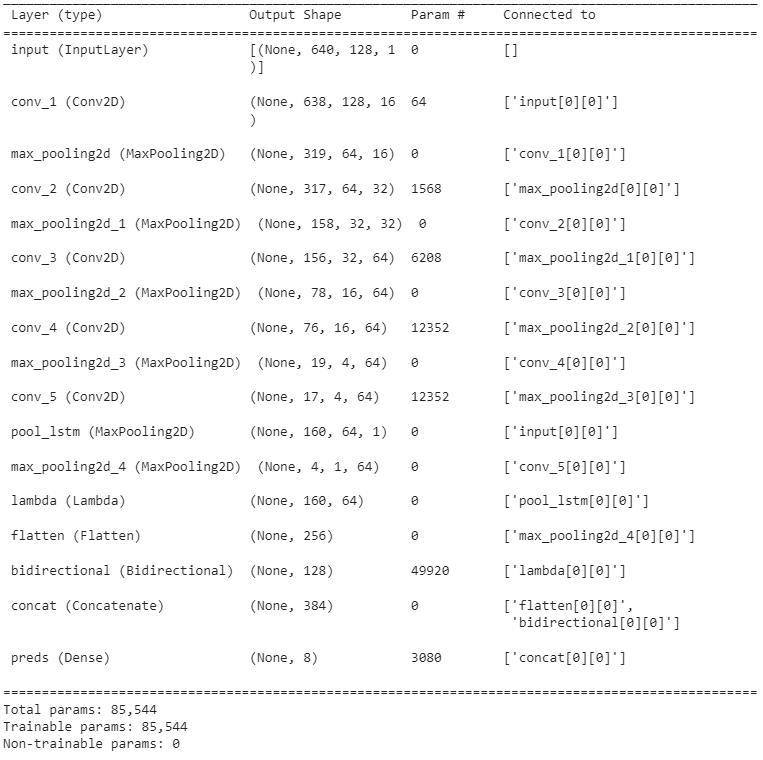

In [11]:
n_frequency = 128
n_frames = 640
input_shape = (n_frames, n_frequency, 1)
model_input = Input(input_shape, name='input')
model = conv_recurrent_model_build(model_input)

Building model...


2022-07-21 01:02:46.172802: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-07-21 01:02:47.231268: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9274 MB memory:  -> device: 0, name: GeForce RTX 2080 Ti, pci bus id: 0000:b1:00.0, compute capability: 7.5


In [12]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 640, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv_0 (Conv2D)                (None, 638, 128, 16  64          ['input[0][0]']                  
                                )                                                                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 319, 64, 16)  0           ['conv_0[0][0]']                 
                                                                                              

Hint: use print(model.summary()) to check if your model satisfies the requirements of the specifications above. 

In [13]:
def train_model(x_train, y_train, x_val, y_val):
    
    n_frequency = 128
    n_frames = 640
    
    x_train = np.expand_dims(x_train, axis = -1)
    x_val = np.expand_dims(x_val, axis = -1)
    
    input_shape = (n_frames, n_frequency, 1)
    model_input = Input(input_shape, name='input')
    
    model = conv_recurrent_model_build(model_input)  ### Step 1
    
    checkpoint_callback = ModelCheckpoint('./models/parallel/weights.best.h5', monitor='val_accuracy', verbose=1,
                                          save_best_only=True, mode='max')
    
    reducelr_callback = ReduceLROnPlateau(
                monitor='val_accuracy', factor=0.5, patience=10, min_delta=0.01,
                verbose=1
            )
    
    callbacks_list = [checkpoint_callback, reducelr_callback]

    # Fit the model and get training history.
    print('Training...')
    history = model.fit(x_train, y_train, batch_size=64, epochs=5,
                        validation_data=(x_val, y_val), verbose=1, callbacks=callbacks_list) ### Step 2
    
    '''
    test_accuracy = model.eval(x_test, y_test)   ### Step 3
    '''

    return model, history

In [14]:
def show_summary_stats(history):
    # List all data in history
    print(history.history.keys())

    # Summarize history for accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # Summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

In [15]:
model, history = train_model(X_train, y_train, X_valid, y_valid)

Building model...
Training...
Epoch 1/5


2022-07-21 01:02:57.608391: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8201
2022-07-21 01:02:58.690044: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-07-21 01:02:58.703212: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-07-21 01:02:58.703308: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2022-07-21 01:02:58.722768: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-07-21 01:02:58.723062: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


100/100 [==============================] - ETA: 0s - loss: 1.9424 - accuracy: 0.2546
Epoch 1: val_accuracy improved from -inf to 0.31500, saving model to ./models/parallel/weights.best.h5
100/100 [==============================] - 17s 79ms/step - loss: 1.9424 - accuracy: 0.2546 - val_loss: 1.8475 - val_accuracy: 0.3150 - lr: 5.0000e-04
Epoch 2/5
100/100 [==============================] - ETA: 0s - loss: 1.7580 - accuracy: 0.3514
Epoch 2: val_accuracy improved from 0.31500 to 0.33250, saving model to ./models/parallel/weights.best.h5
100/100 [==============================] - 7s 70ms/step - loss: 1.7580 - accuracy: 0.3514 - val_loss: 1.7298 - val_accuracy: 0.3325 - lr: 5.0000e-04
Epoch 3/5
100/100 [==============================] - ETA: 0s - loss: 1.6799 - accuracy: 0.3807
Epoch 3: val_accuracy improved from 0.33250 to 0.35875, saving model to ./models/parallel/weights.best.h5
100/100 [==============================] - 7s 65ms/step - loss: 1.6799 - accuracy: 0.3807 - val_loss: 1.6605 - 

### Results


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])


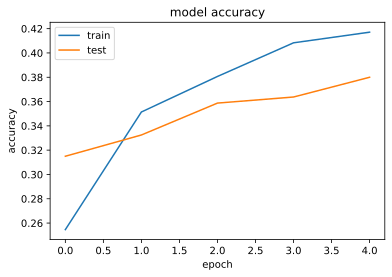

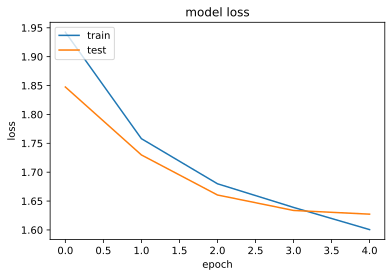

In [16]:
show_summary_stats(history)

In [17]:
from sklearn.metrics import classification_report

y_true = np.argmax(y_valid, axis = 1)
X_valid = np.expand_dims(X_valid, axis = -1)
y_pred = model.predict(X_valid)
y_pred = np.argmax(y_pred, axis=1)
labels = [0,1,2,3,4,5,6,7]
target_names = dict_genres.keys()

print(y_true.shape, y_pred.shape)
print(classification_report(y_true, y_pred, target_names=target_names))

25/25 [==============================] - 1s 16ms/step
(800,) (800,)
               precision    recall  f1-score   support

   Electronic       0.40      0.55      0.47       100
 Experimental       0.30      0.17      0.22       100
         Folk       0.38      0.75      0.51       100
      Hip-Hop       0.46      0.29      0.36       100
 Instrumental       0.33      0.31      0.32       100
International       0.50      0.10      0.17       100
          Pop       0.11      0.01      0.02       100
         Rock       0.38      0.86      0.53       100

     accuracy                           0.38       800
    macro avg       0.36      0.38      0.32       800
 weighted avg       0.36      0.38      0.32       800



##### Question 5 (10 points)

Briefly describe, in a few sentences, the training results. Does the model perform well? What can we learn from the train and test loss curves? Is the model overfitted? What do the metrics tell us?

*Note that you can increase the number of epochs to get a better picture of the models performance


``` Your response here ```

The model may be underfitting; more epochs might be needed. The model scored an average of 0.36 in precison and 0.38 in recall (sensitivity); both are less than 50%; there is room for improvement.

### Visualizing the Model

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# best square fit for the given number
def _best_square(n):
    x = int(np.sqrt(n) - 0.001) + 1 
    y = int(np.ceil(n / x))
    return x, y

def _imshow(img, ax, *args, **kwargs):
    while len(np.shape(img)) < 2:
        img = np.expand_dims(img, axis = 0)
    return ax.imshow(img, *args, **kwargs)
    
def display_activations(
    activations, 
    data_format = 'channels_last', 
    fig = None,
    subplot_opts = {},
    imshow_opts = {}, 
    colorbar_opts = {}
):
    """
    Plot the activations for each layer using matplotlib
    :param activations: dict - mapping layers to corresponding activations (1, output_h, output_w, num_filters)
    :param cmap: string - a valid matplotlib colormap to be used
    :param data_format: string - one of "channels_last" (default) or "channels_first".
    The ordering of the dimensions in the inputs. "channels_last" corresponds to inputs with
    shape (batch, steps, channels) (default format for temporal data in Keras) while "channels_first"
    corresponds to inputs with shape (batch, channels, steps).
    :return: figure
    """
    
    if fig is None:
        fig = plt.figure()
    
    nrows, ncols = _best_square(len(activations))
    subfigs = fig.subfigures(
        nrows = nrows, ncols = ncols
    )

    for subfig, (layer_name, acts) in zip(subfigs.flatten(), activations.items()):  
        if len(acts) != 1:
            continue    
            
        subfig.suptitle(f'{layer_name} {acts.shape}')
            
        acts = acts[0]

        hmap, axes = None, None
        if len(acts.shape) <= 1:
            # no channel
            axes = subfig.subplots(**subplot_opts)
            axes.axis('off')
            hmap = _imshow(acts, ax = axes, **imshow_opts)
        else:
            try:
                c = {
                    'channels_last': -1,
                    'channels_first': 0
                }[data_format]
            except KeyError:
                raise Exception('Unknown data_format.') 
                
            n_channels = acts.shape[c]
            
            nrows, ncols = _best_square(n_channels)
            axes = subfig.subplots(nrows, ncols, **subplot_opts)
            for i, ax in enumerate(axes.flatten() if iterable(axes) else [axes]):
                if i >= n_channels:
                    ax.set_visible(False)
                    continue
                ax.axis('off')

                try:
                    img = {
                        'channels_last': lambda: acts[..., i],
                        'channels_first': lambda: acts[i, ...]
                    }[data_format]()
                except KeyError:
                    raise Exception('Unknown data_format.')
                hmap = _imshow(img, ax = ax, **imshow_opts)
                
        if hmap is not None and axes is not None:
            subfig.colorbar(hmap, ax = axes, **colorbar_opts)
            
    return fig

genre 1 Experimental


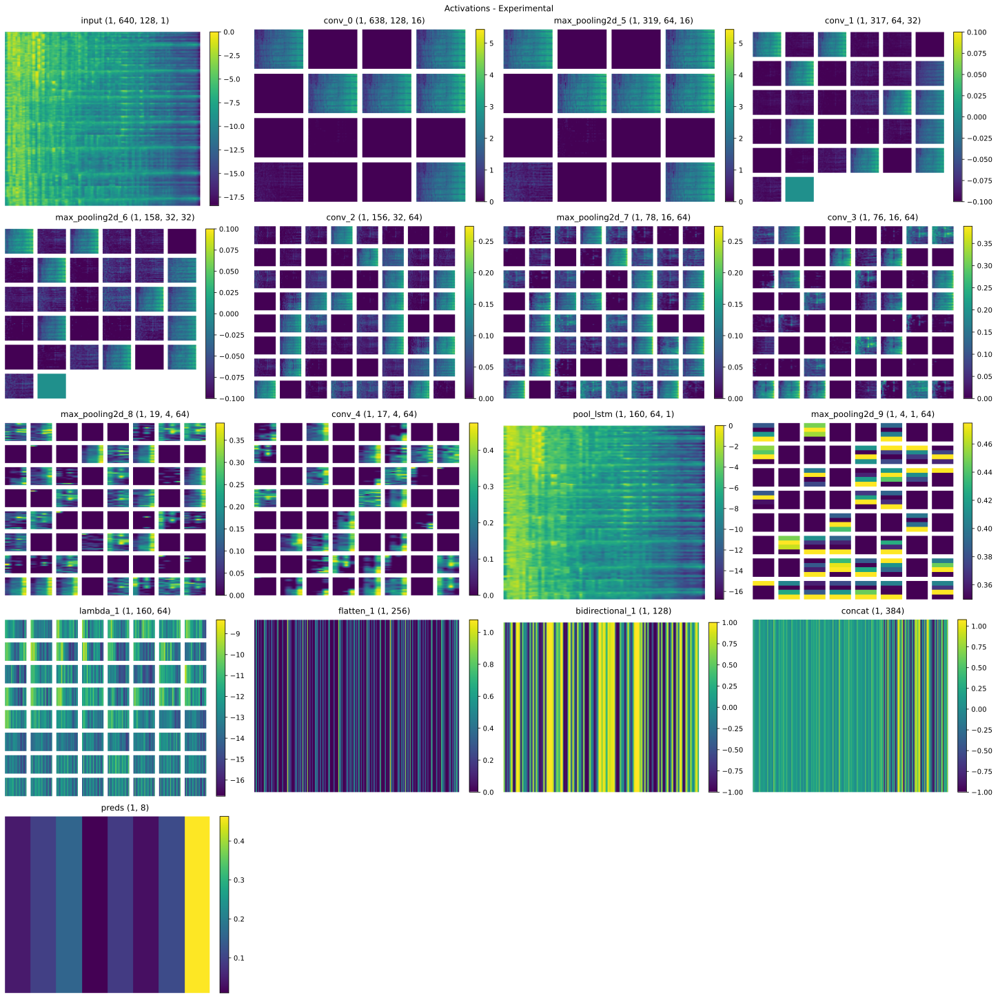

In [19]:
one_arbitrary_sample = 0
sample = X_valid[one_arbitrary_sample:one_arbitrary_sample+1]
genre = np.argmax(y_valid[one_arbitrary_sample])
print('genre', genre, reverse_map[genre])
activations = keract.get_activations(model, sample, layer_names=None, nodes_to_evaluate=None, output_format='simple', nested=False, auto_compile=True)

fig = plt.figure(
    figsize = (20, 20),
    constrained_layout = True
)
fig.suptitle(f'Activations - {reverse_map[genre]}')
display_activations(activations, data_format = 'channels_last', fig = fig)
fig.show()

##### Question 6 (20 points)
Visualize the activation layers for the CNN using the code above and try a few samples for each genre. Are there any clear features? Are any of the features similar to the features you expected at the start? Are there similar or different features across genres?

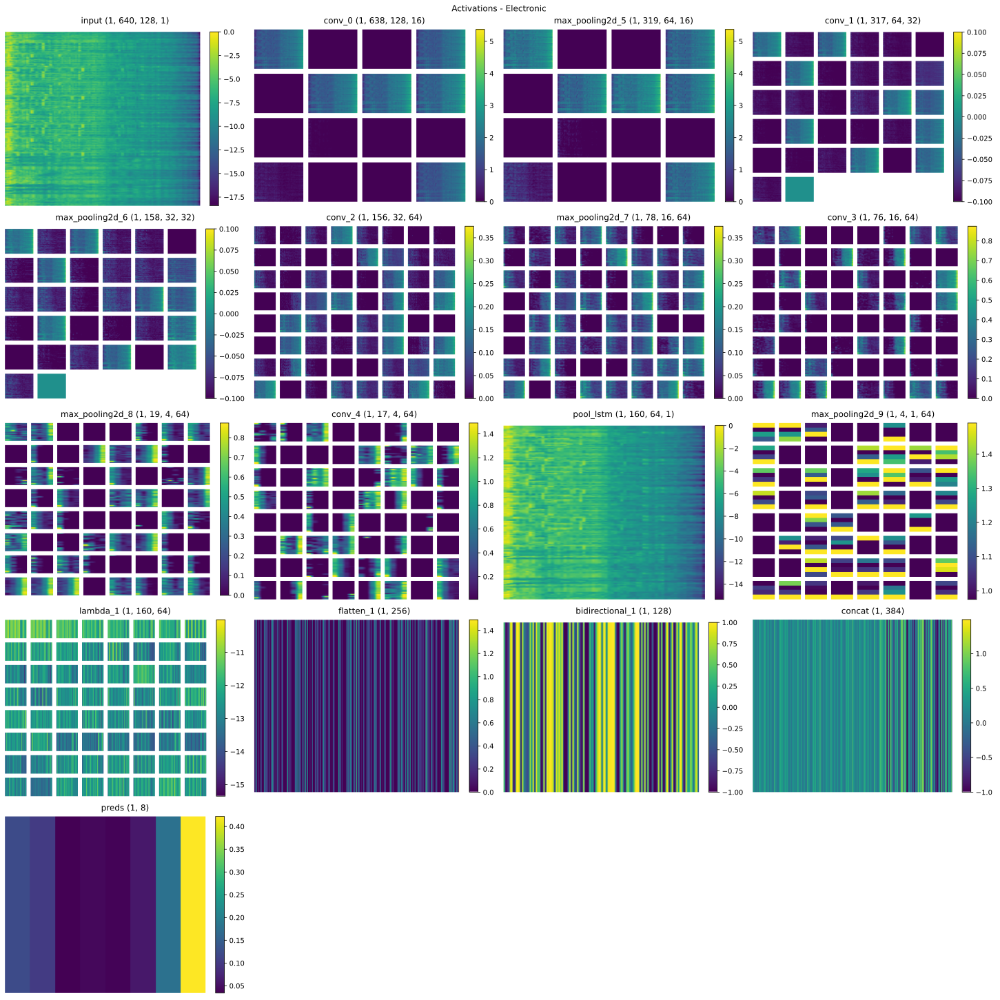

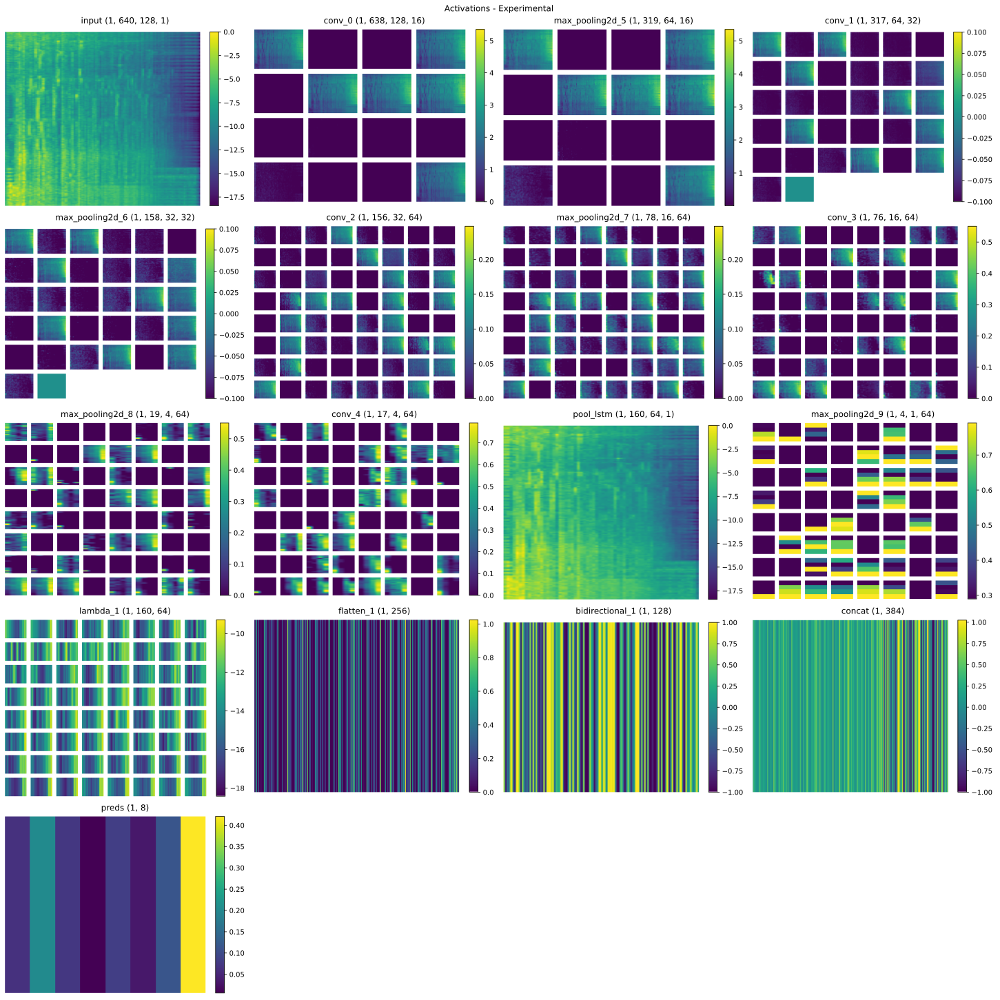

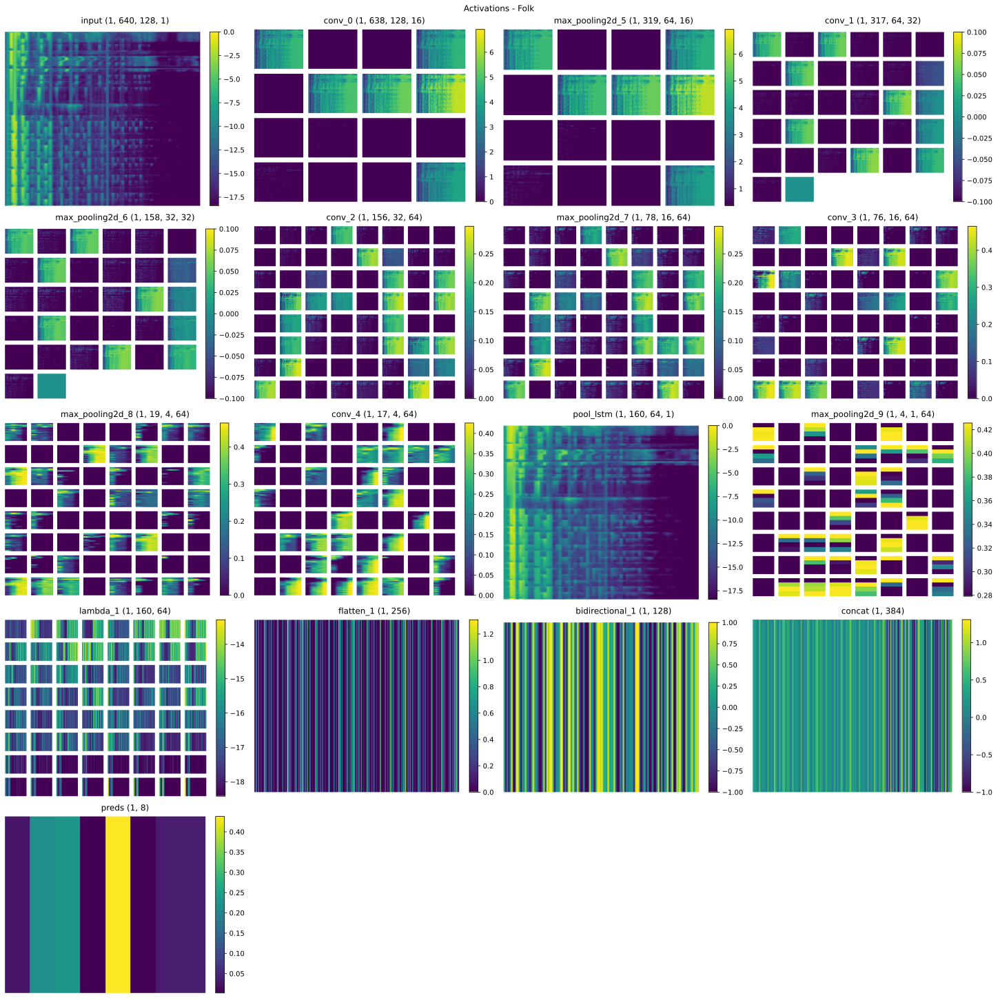

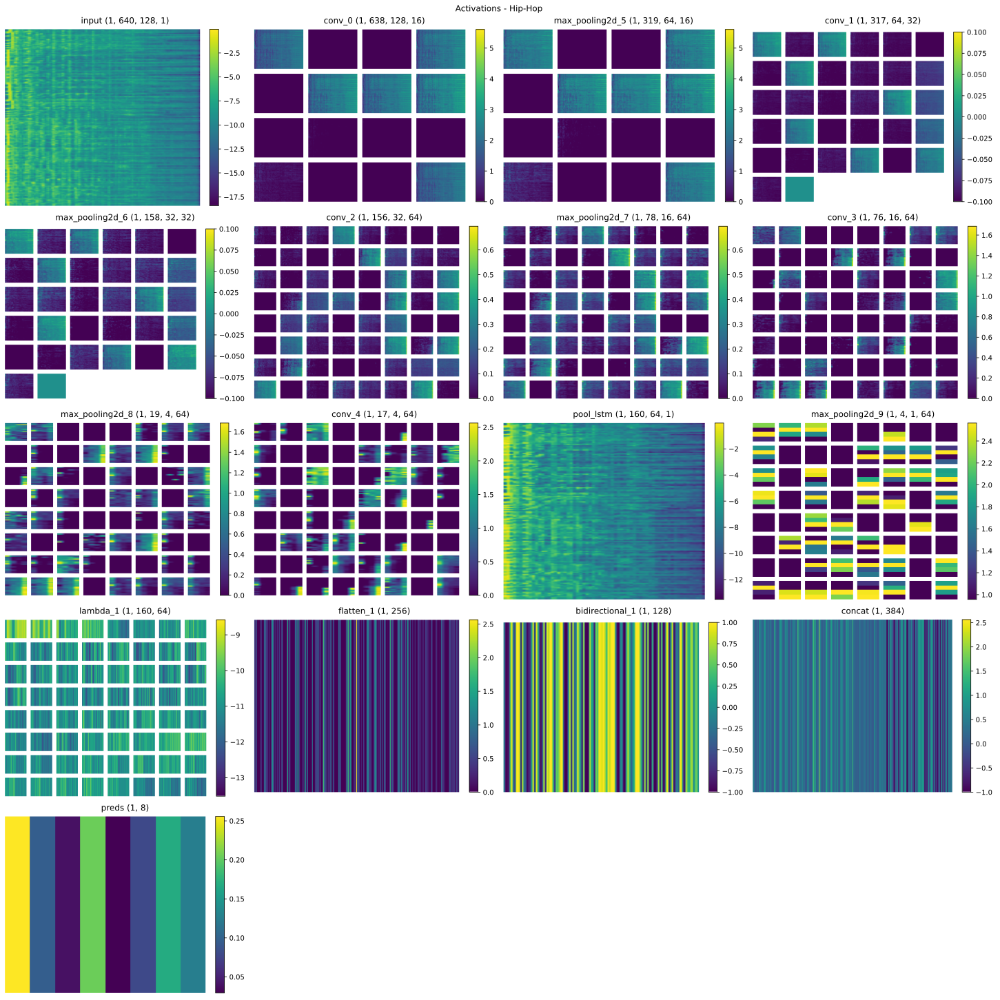

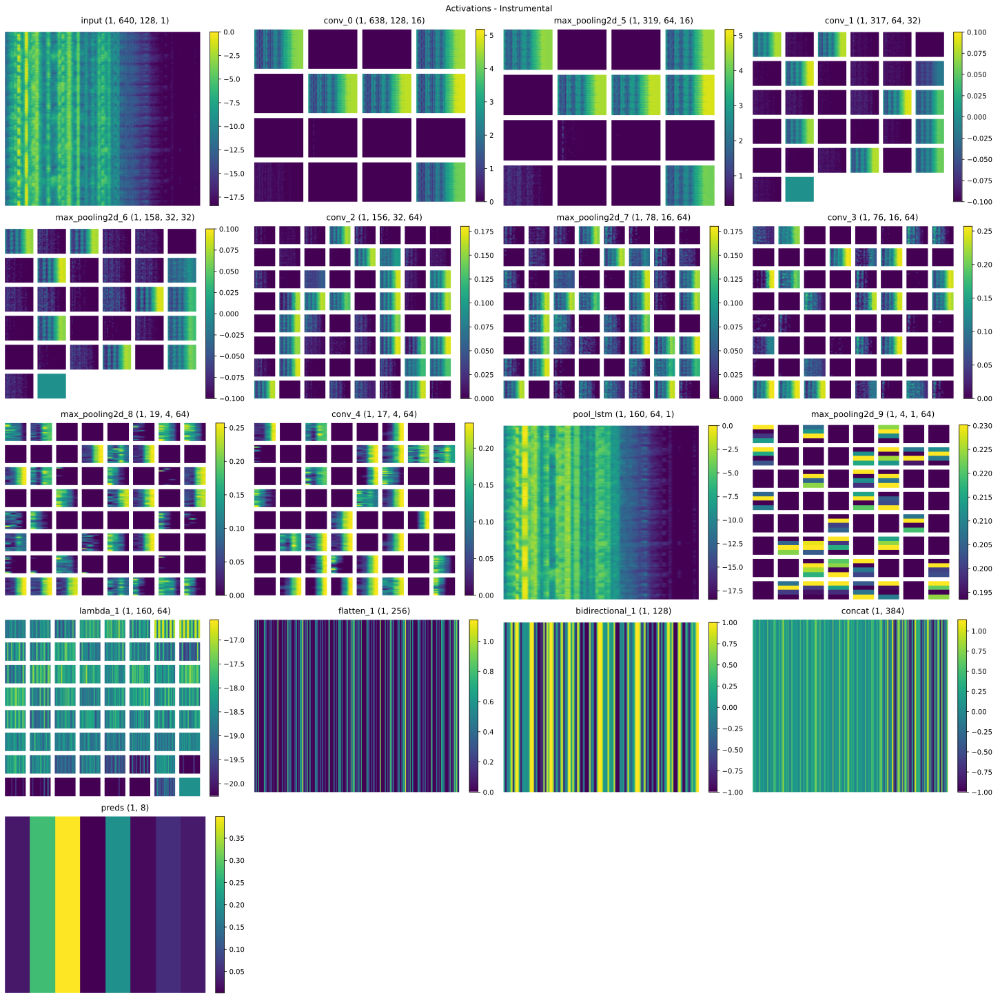

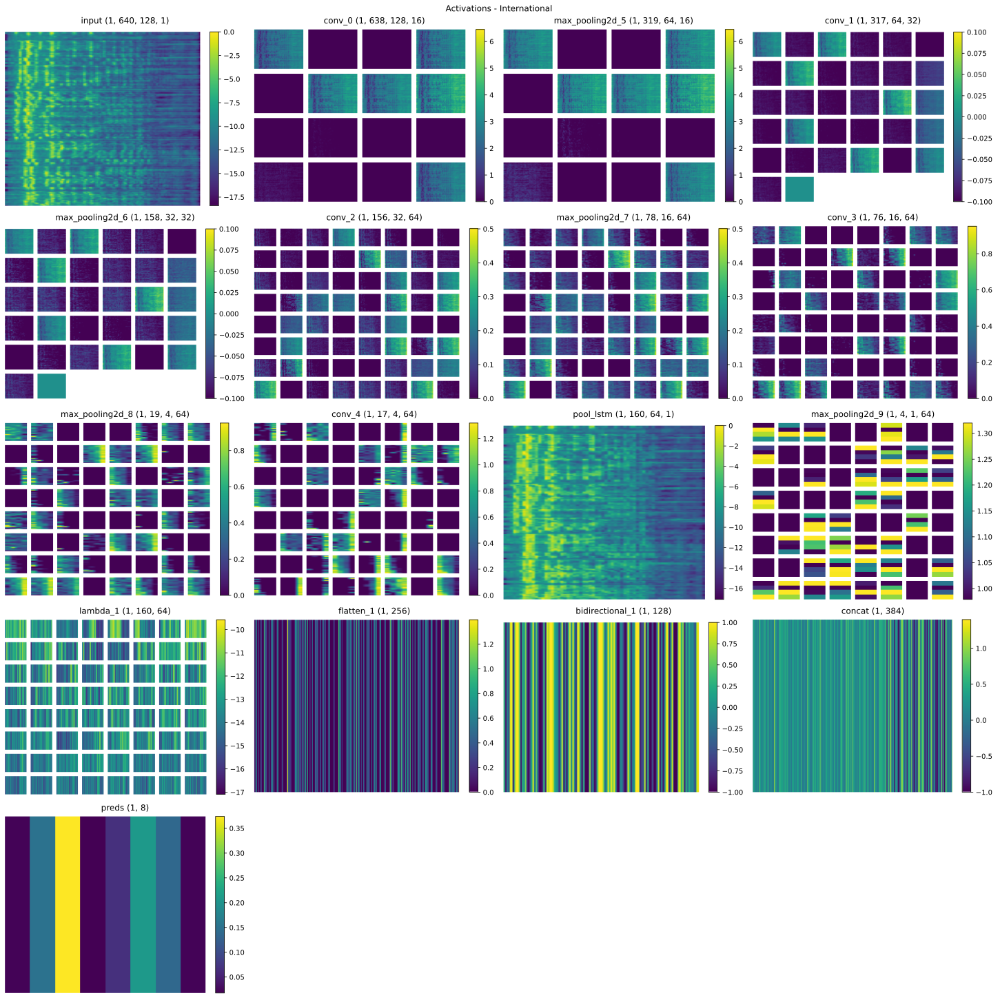

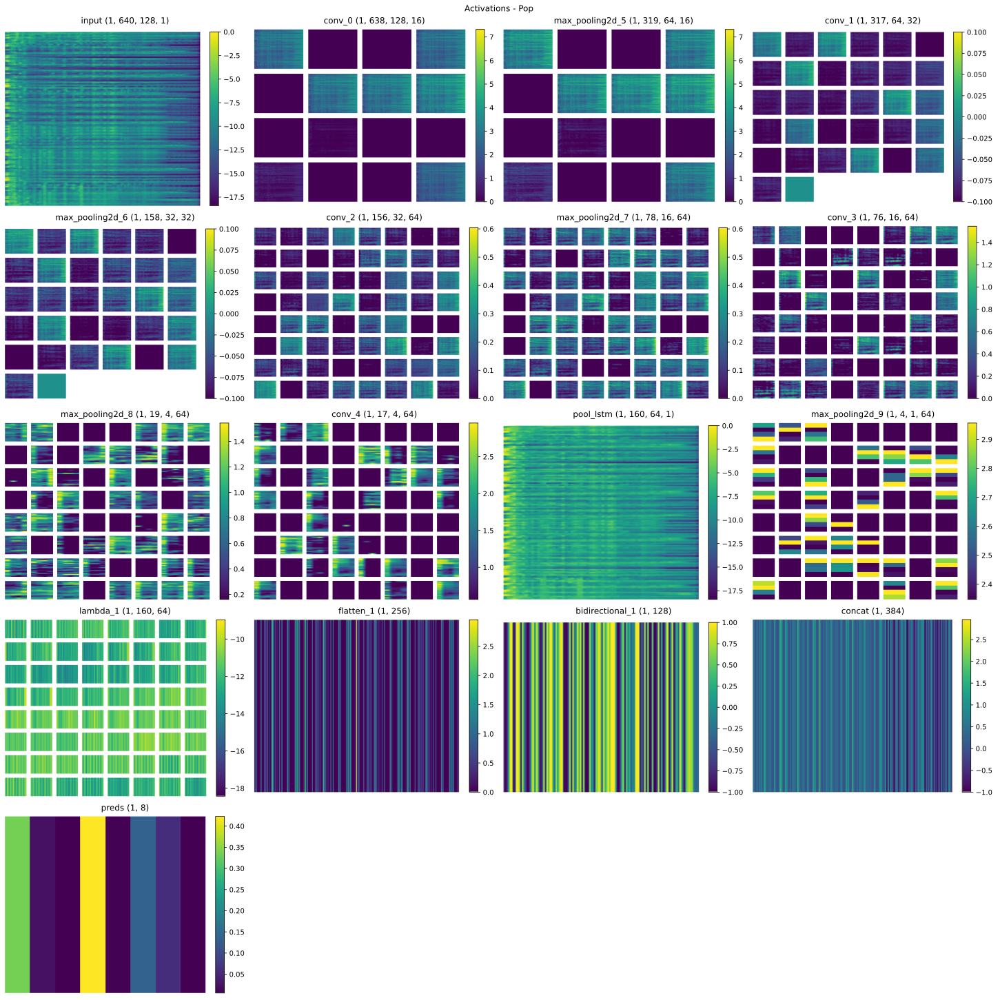

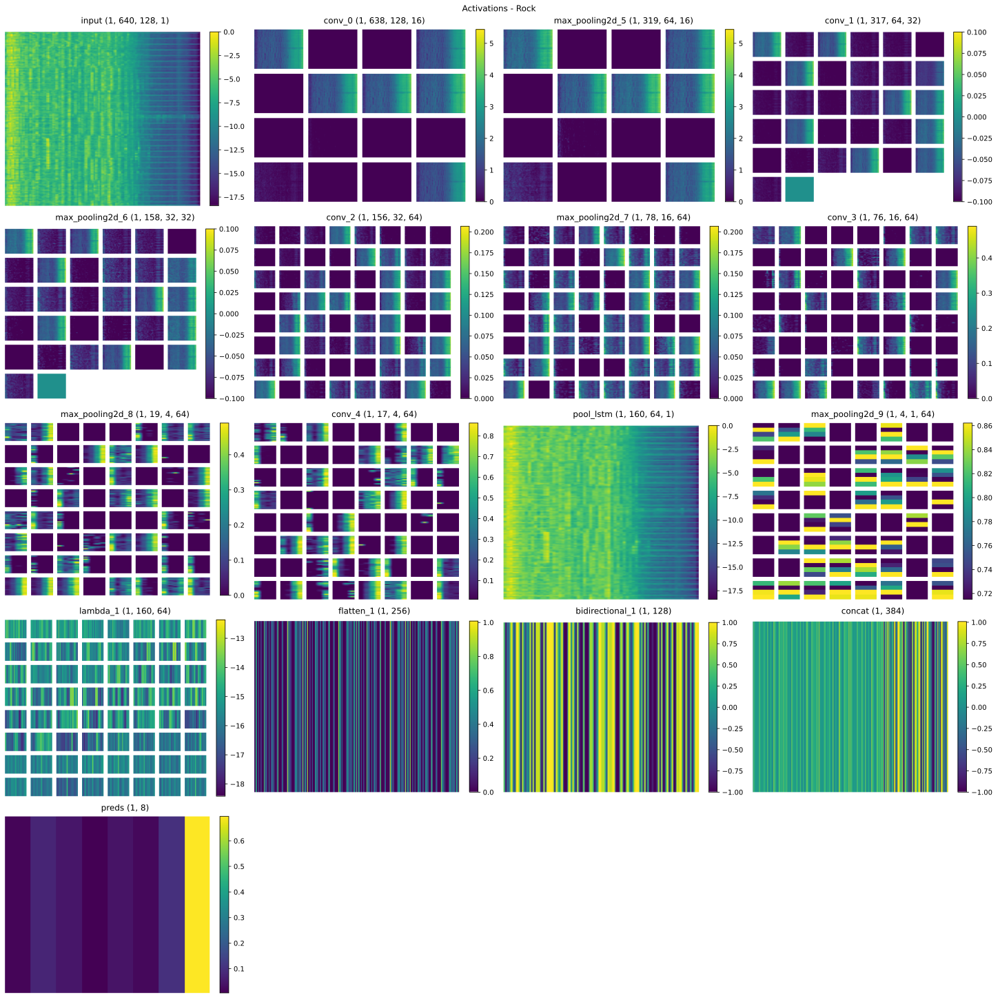

In [20]:
sample_act = _sample_genre(y_valid, size = 1)

for genre, samples in sample_act.items():
    fig = plt.figure(
        figsize = (20, 20),
        constrained_layout = True
    )    
    fig.suptitle(f'Activations - {genre}')
    subfigs = fig.subfigures(
        nrows = 1, ncols = len(samples)
    )
    
    for subfig, sample in zip(subfigs.flatten() if iterable(subfigs) else [subfigs], samples):
        sample = X_valid[sample]
        activations = keract.get_activations(
            model, sample[np.newaxis, :], 
            layer_names = None, 
            nodes_to_evaluate = None, 
            output_format = 'simple', 
            nested = False, 
            auto_compile = True
        )
        display_activations(activations, data_format = 'channels_last', fig = subfig)
        
    fig.show()

``` Your response here ```

Electronic is similar to experimental; Instrumental is similar to international. Hip-hop and rock are the two most distinct genres.